In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import imageio
import re
import seaborn as sns
import numpy as np
import tqdm as tqdm
import random
import shutil


# Parameters 

In [2]:
FOLDERS = ['girl','boy']

# Read_len_gif

In [4]:
def read_len_frames(input_folder) :
    list_len = []
    list_path = []
    for root, dirs, files in os.walk(input_folder):
        for file in files :
            if file.lower().endswith('.gif'):
                gif_path = os.path.join(root, file)
                gif = imageio.get_reader(gif_path)
                list_len.append(len(gif))
                list_path.append(re.search(r'gif_(.*?).gif', gif_path).group(1))
    return pd.DataFrame(list(zip(list_path, list_len)), columns=['number', 'length'])

df_boy = read_len_frames('boy') 
df_girl = read_len_frames('girl') 
print(f"Shape de df_girl : {df_girl.shape}")
print(f"Shape de df_boy : {df_boy.shape}")

Shape de df_girl : (10539, 2)
Shape de df_boy : (5359, 2)


# Supprimer les GIFs mal téléchargés

In [2]:
def delete_wrong_file(df, dossier, greater_number, params=True):
    if params :
        nom_a_supprimer = list(df.loc[df['length'] == 1, "number"])
        path_a_supprimer = ['gif_' + nom + '.gif' for nom in nom_a_supprimer]
    else :
        nom_a_supprimer = list(df.loc[df['length'] >= greater_number, "number"])
        path_a_supprimer = ['gif_' + nom + '.gif' for nom in nom_a_supprimer]
        
    for fichier in os.listdir(dossier):
        chemin_fichier = os.path.join(dossier, fichier)
        if fichier in path_a_supprimer:
            os.remove(chemin_fichier)
                      

In [5]:
len_girl = len(os.listdir('girl'))
delete_wrong_file(df_girl, 'girl', 0, params=True)
print(f"{len_girl - len(os.listdir('girl'))} GIFs mal téléchargés ont été supprimés")
len_boy = len(os.listdir('boy'))
delete_wrong_file(df_boy, 'boy', 0, params=True)
print(f"{len_boy - len(os.listdir('boy'))} GIFs mal téléchargés ont été supprimés")

140 GIFs mal téléchargés ont été supprimés
48 GIFs mal téléchargés ont été supprimés


# Visualization

In [14]:
print(df_girl[df_girl['number'] == 17])
df_girl.head(25)


Empty DataFrame
Columns: [number, length]
Index: []


,number,length
0,0,16
1,1,20
2,10,40
3,100,63
4,1000,57
5,10000,38
6,10001,80
7,10002,50
8,10003,24
9,10004,24


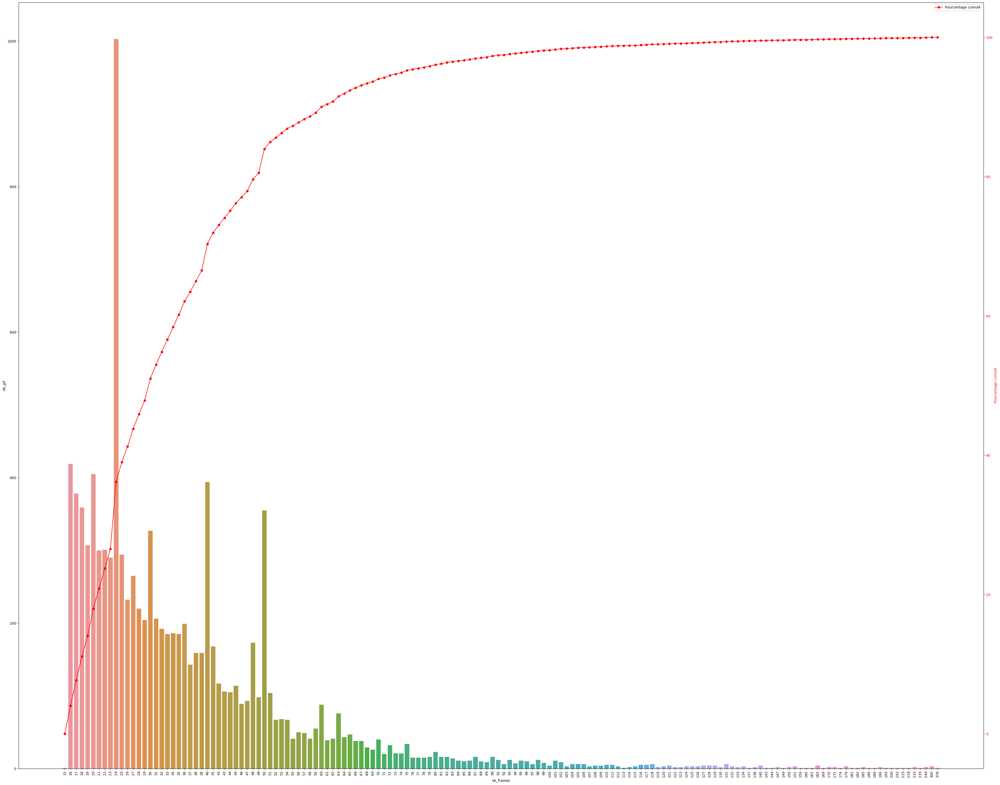

In [17]:
frames_count = df_girl['length'].value_counts().sort_index()
cumulative_percentage = (frames_count.cumsum() / frames_count.sum()) * 100
number_of_frames = np.arange(0,df_girl['length'].nunique(),1)

plt.figure(figsize=(50, 40))
ax = sns.countplot(data = df_girl, x = 'length')
plt.xlabel('nb_frames')
plt.xticks(rotation=90)
plt.ylabel('nb_gif')
ax2 = ax.twinx()
ax2.plot(number_of_frames, cumulative_percentage, color='r', marker='o', linestyle='-', label='Pourcentage cumulé')
ax2.set_ylabel('Pourcentage cumulé', color='r')
ax2.tick_params(axis='y', labelcolor='r')

ax2.legend(loc='upper right')
plt.show()

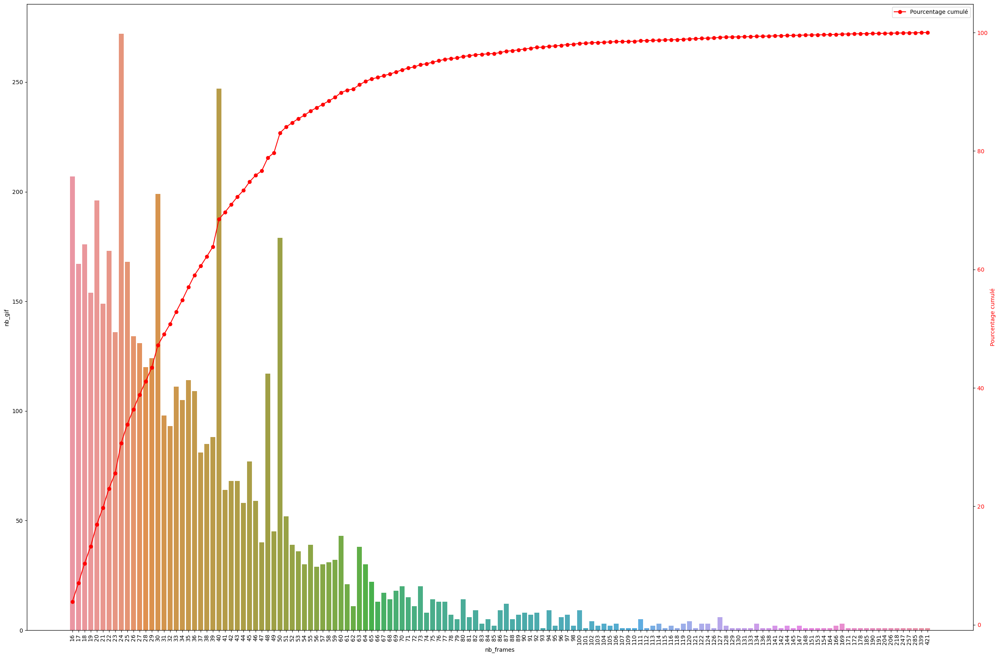

In [18]:
#(len(df_boy[df_boy['length'] <= 60])/len(df_boy))*100

frames_count = df_boy['length'].value_counts().sort_index()
cumulative_percentage = (frames_count.cumsum() / frames_count.sum()) * 100
number_of_frames = np.arange(0,df_boy['length'].nunique(),1)

plt.figure(figsize=(30, 20))
ax = sns.countplot(data = df_boy, x = 'length')
plt.xlabel('nb_frames')
plt.xticks(rotation=90)
plt.ylabel('nb_gif')
ax2 = ax.twinx()
ax2.plot(number_of_frames, cumulative_percentage, color='r', marker='o', linestyle='-', label='Pourcentage cumulé')
ax2.set_ylabel('Pourcentage cumulé', color='r')
ax2.tick_params(axis='y', labelcolor='r')

ax2.legend(loc='upper right')
plt.show()

In [6]:
MAX_LENGTH_GIF_BOY = 30
MAX_LENGTH_GIF_GIRL = 30

# Supprimer les Gifs plus longs que voulus

In [7]:
MAX_LENGTH_GIF = min(MAX_LENGTH_GIF_BOY,MAX_LENGTH_GIF_GIRL)

In [8]:

len_girl = len(os.listdir('girl'))
delete_wrong_file(df_girl, 'girl', MAX_LENGTH_GIF, params=False)
print(f"{len_girl - len(os.listdir('girl'))} GIFs de longueurs > {MAX_LENGTH_GIF} ont été supprimés")


len_boy = len(os.listdir('boy'))
delete_wrong_file(df_boy, 'boy', MAX_LENGTH_GIF, params=False)
print(f"{len_boy - len(os.listdir('boy'))} GIFs de longueurs > {MAX_LENGTH_GIF} ont été supprimés")

5421 GIFs de longueurs > 30 ont été supprimés
3004 GIFs de longueurs > 30 ont été supprimés


# Padding gif

In [2]:
! pip install imageio[pyav]
import imageio.v3 as iio

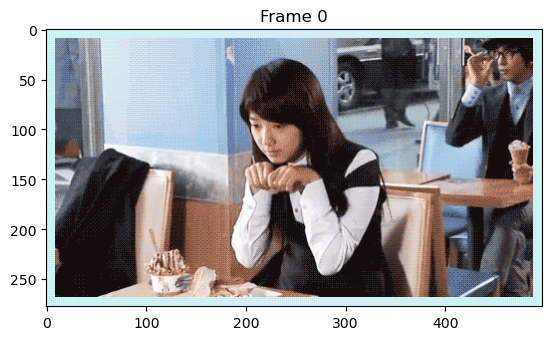

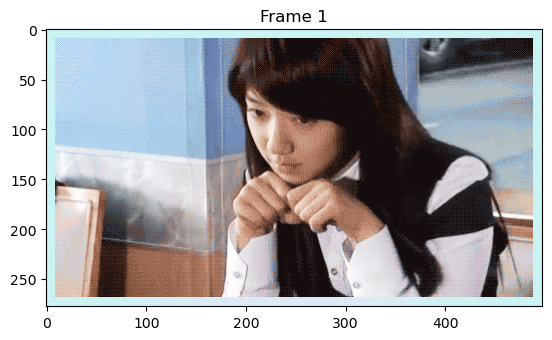

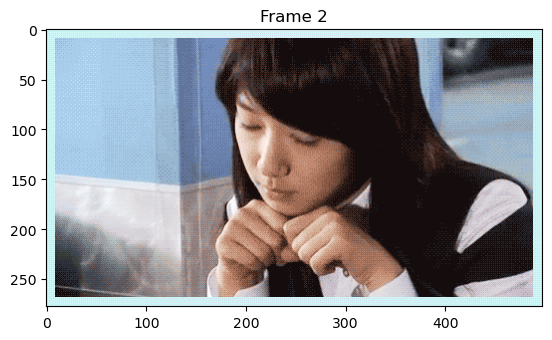

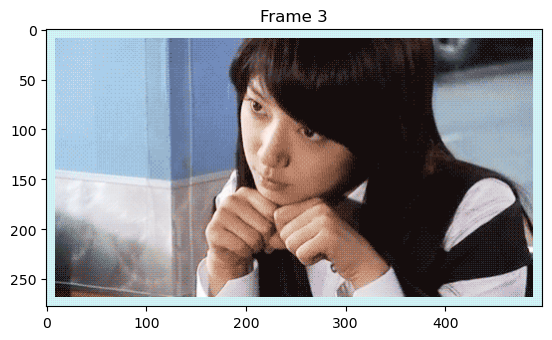

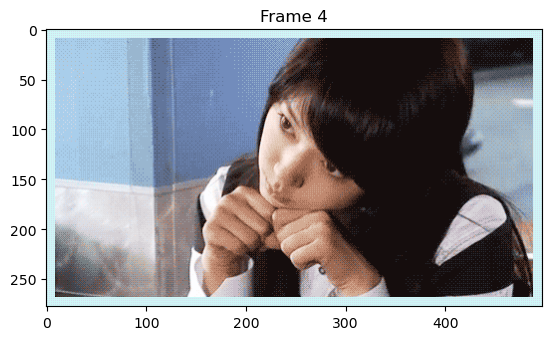

...

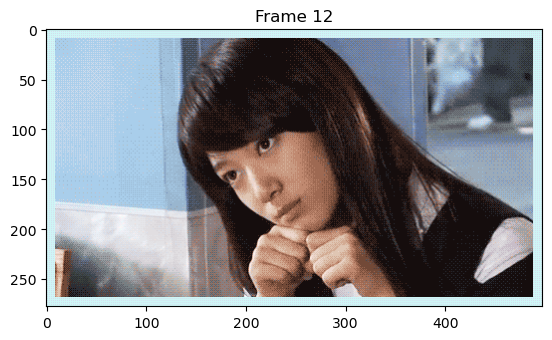

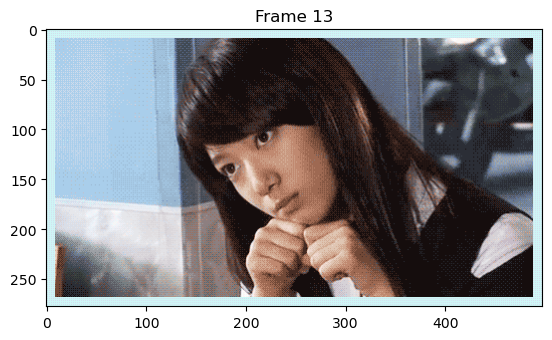

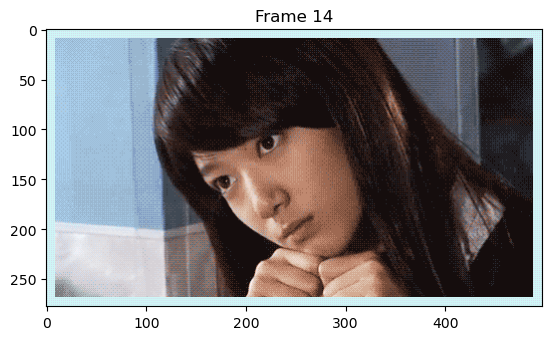

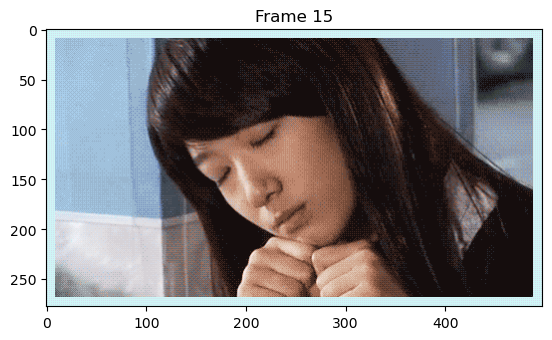

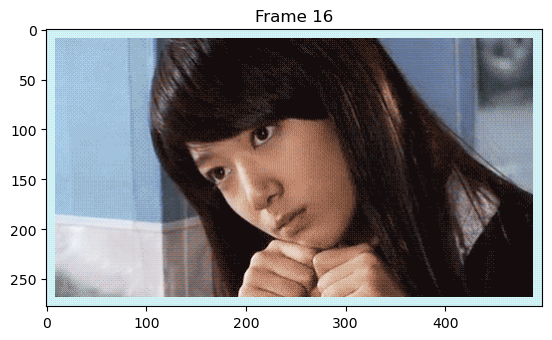

In [5]:
# Test
gif_path = "girl/gif_52.gif"
#frames = iio.imread(gif_path, plugin="pyav")
frames = imageio.get_reader(gif_path)
# Display each frame
for frame_number in range(len(frames)):
    frame = frames.get_data(frame_number)
    plt.imshow(frame)
    plt.title(f"Frame {frame_number}")
    plt.show()

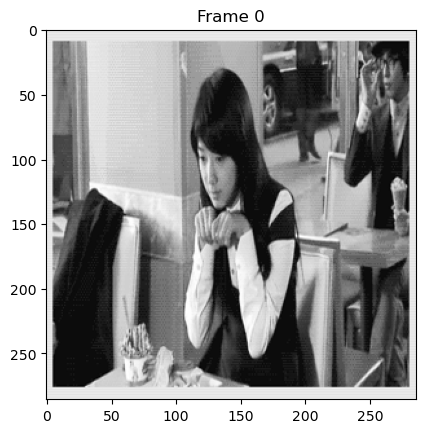

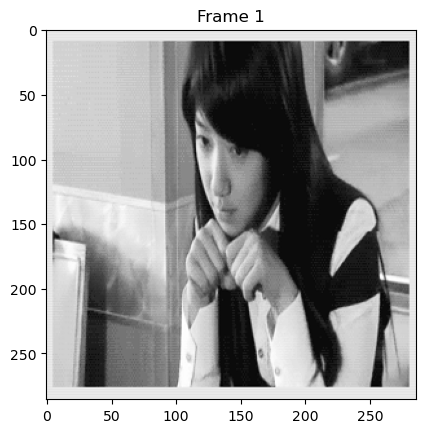

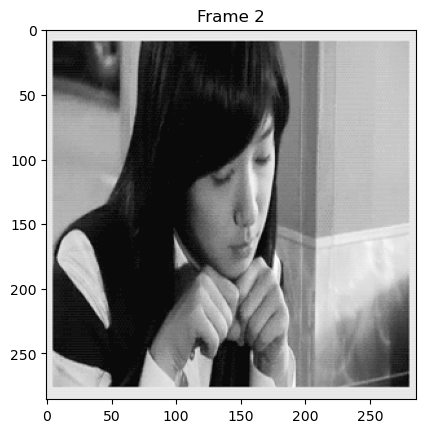

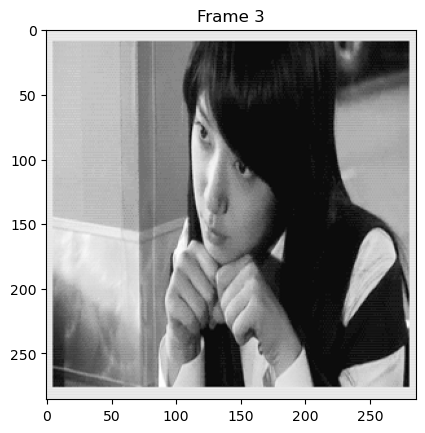

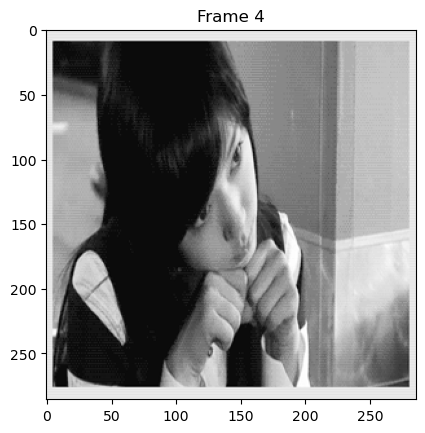

...

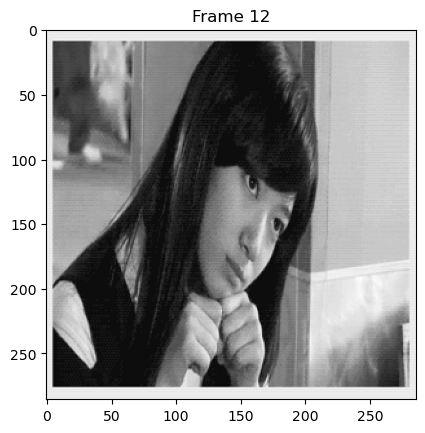

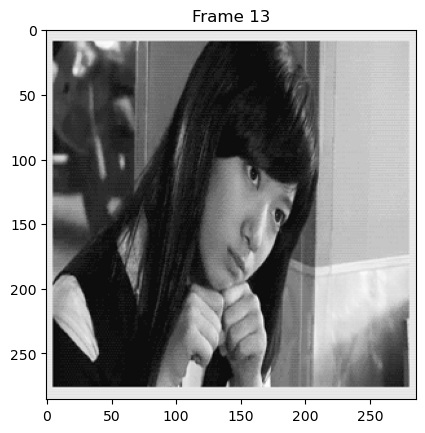

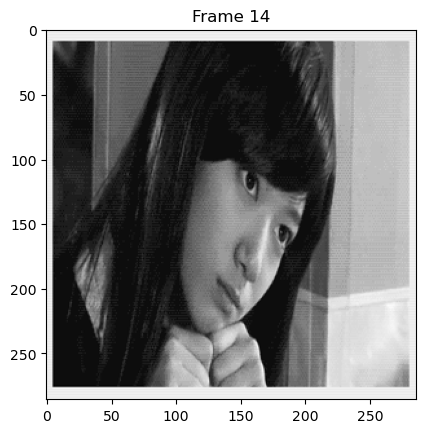

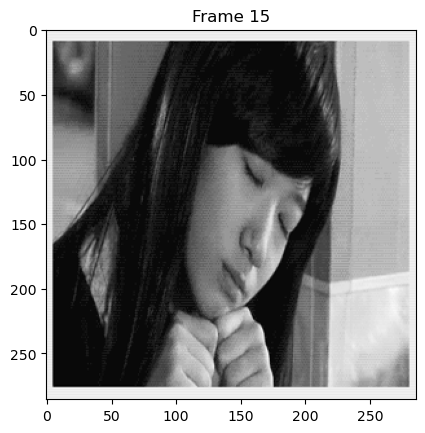

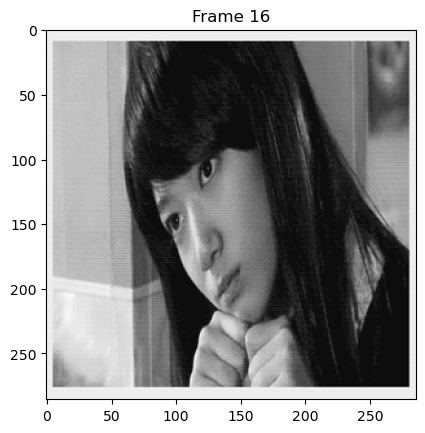

In [6]:
import torchvision.transforms as transforms
import torch
from PIL import Image

gif_path = "girl/gif_52.gif"

frames = Image.open(gif_path)


transform_list = []
transform_list.append(transforms.Grayscale(1))
transform_list.append(transforms.Resize((286,286), transforms.InterpolationMode.BICUBIC))

transform_list += [transforms.ToTensor()]
transform_list += [transforms.Normalize((0.5,), (0.5,))]
transform_list += [transforms.RandomHorizontalFlip()]
trans = transforms.Compose(transform_list)

dummy_tensor = torch.zeros((286,286))


# Display each frame
for frame_number in range(frames.n_frames):
    if frame_number == 0:
        frame = frames
    if frame_number > 0:
        frames.seek(frame_number)
        frame = frames
    frame = trans(frame)
    
    # Remove the singleton channel dimension
    frame = frame.squeeze(0)
    
    # Denormalize for display (assumes mean=0.5, std=0.5)
    frame = frame * 0.5 + 0.5
    
    plt.imshow(frame, cmap='gray')  # Use cmap='gray' for grayscale images
    plt.title(f"Frame {frame_number}")
    plt.show()

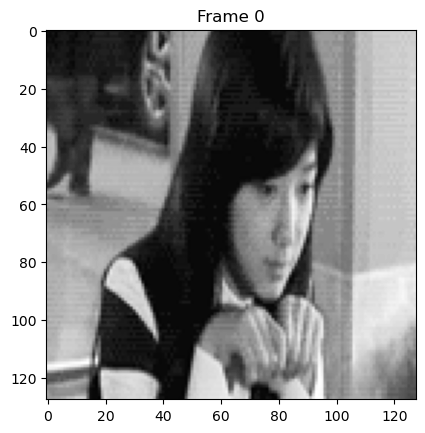

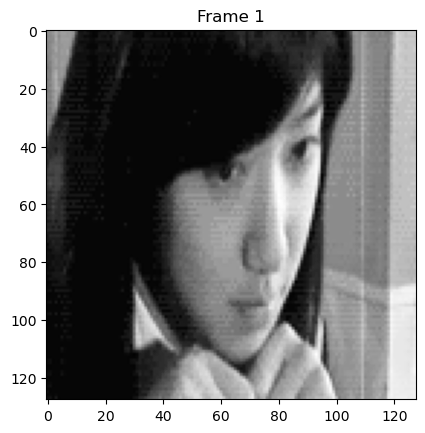

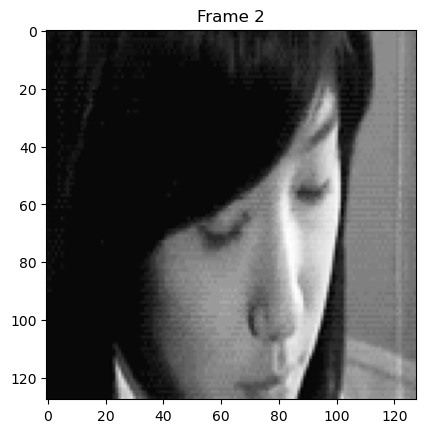

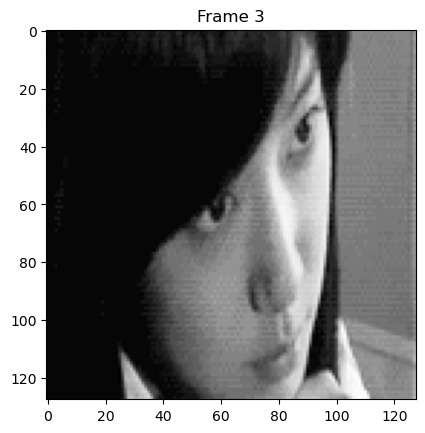

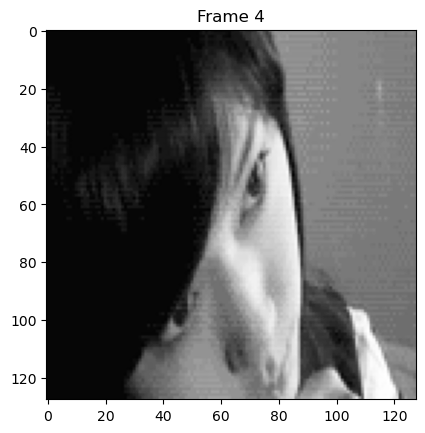

...

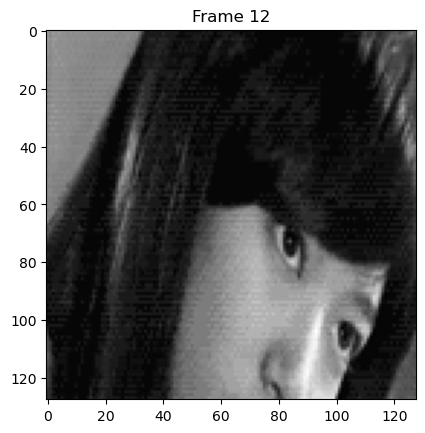

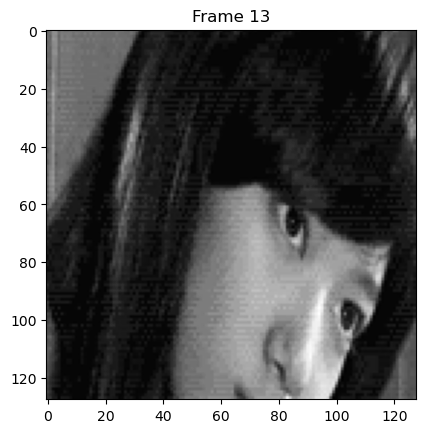

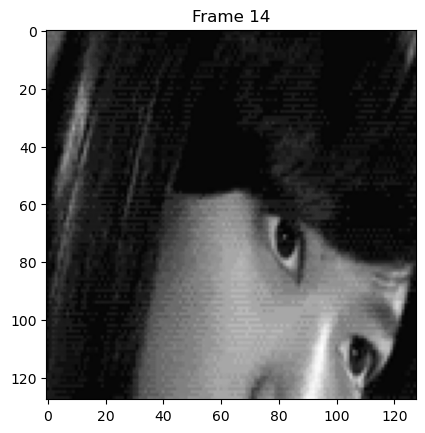

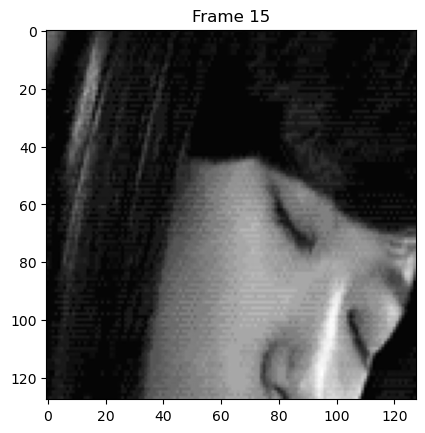

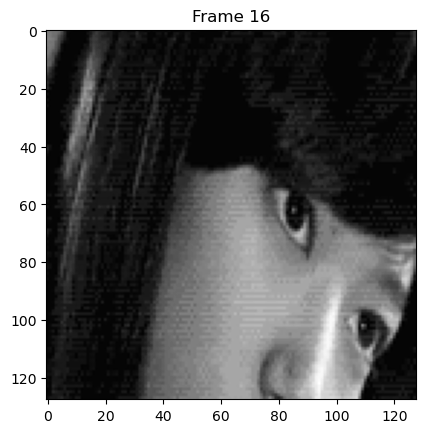

In [20]:
import torchvision.transforms as transforms
import torch
from PIL import Image
import random
import matplotlib.pyplot as plt

gif_path = "girl/gif_52.gif"

frames = Image.open(gif_path)

transform_list = []
transform_list.append(transforms.Grayscale(1))
transform_list.append(transforms.Resize((286, 286), transforms.InterpolationMode.BICUBIC))
transform_list += [transforms.ToTensor()]
transform_list += [transforms.Normalize((0.5,), (0.5,))]

trans = transforms.Compose(transform_list)

dummy_tensor = torch.zeros((286, 286))

i, j, h, w = transforms.RandomCrop.get_params(dummy_tensor, output_size=(128, 128))

random_flip = False
if random.random() > 0.5:
    random_flip = True

# Display each frame
for frame_number in range(frames.n_frames):
    if frame_number == 0:
        frame = frames
    if frame_number > 0:
        frames.seek(frame_number)
        frame = frames
    frame = trans(frame)
    frame = transforms.functional.crop(frame, i, j, h, w)
    if random_flip:
        frame = transforms.functional.hflip(frame)
    
    # Remove the singleton channel dimension
    frame = frame.squeeze(0)
    
    # Denormalize for display (assumes mean=0.5, std=0.5)
    frame = frame * 0.5 + 0.5
    
    plt.imshow(frame, cmap='gray')  # Use cmap='gray' for grayscale images
    plt.title(f"Frame {frame_number}")
    plt.show()


In [23]:
# Test
print(frames)

[[[[ 40  22  29]
   [  0   0   0]
   [  7   4  17]
   ...
   [ 20   7  14]
   [  7   4  17]
   [ 34  38  53]]

  [[  8   0   2]
   [  0   0   0]
   [  0   0   0]
   ...
   [  7   4  17]
   [  7   4  17]
   [ 20   7  14]]

  [[ 20   7  14]
   [  0   0   0]
   [  0   0   0]
   ...
   [  7   4  17]
   [  0   0   0]
   [ 20   7  14]]

  ...

  [[  8   0   2]
   [  0   0   0]
   [  0   0   0]
   ...
   [  0   0   0]
   [  0   0   0]
   [  8   0   2]]

  [[  0   0   0]
   [  0   0   0]
   [  0   0   0]
   ...
   [  0   0   0]
   [  0   0   0]
   [  0   0   0]]

  [[  8  17   7]
   [  0   0   0]
   [  8   0   2]
   ...
   [  8   0   2]
   [  0   0   0]
   [  8  17   7]]]


 [[[ 40  22  29]
   [  0   0   0]
   [  7   4  17]
   ...
   [ 17  22  36]
   [  7   4  17]
   [ 34  38  53]]

  [[  8   0   2]
   [  0   0   0]
   [  0   0   0]
   ...
   [  7   4  17]
   [  7   4  17]
   [  7   4  17]]

  [[  7   4  17]
   [  0   0   0]
   [  0   0   0]
   ...
   [  7   4  17]
   [  0   0   0]
   [ 17  22

In [66]:
frames = iio.imread("girl/gif_10582.gif", plugin="pyav")
result_array = np.concatenate((frames, np.concatenate([frames[-1][np.newaxis, :] for _ in range(100)], axis=0)), axis=0)

# Création des dossiers test/train en fonction d'une seed

In [9]:

def create_test_train_folders(dataset_name, target_folder_path, source_folder_1, source_folder_2, train_size, test_size, random_seed = 42):
    # Set de la seed pour le rando
    random.seed(random_seed)
    
    
    # Création des dossiers cibles s'ils n'existent pas
    path = target_folder_path +"/"+ dataset_name
    if not os.path.exists(path):
        os.makedirs(path, exist_ok=True)
        
    print(path)
    
    folder_path_trainA = path + "/trainA"
    folder_path_trainB = path + "/trainB"
    folder_path_testA = path + "/testA"
    folder_path_testB = path + "/testB"
    print(folder_path_trainA)
    print(folder_path_trainB)
    print(folder_path_testA)
    print(folder_path_testB)
    if not os.path.exists(folder_path_trainA):
        os.makedirs(folder_path_trainA, exist_ok=True)
    if not os.path.exists(folder_path_trainB):
        os.makedirs(folder_path_trainB, exist_ok=True)
    if not os.path.exists(folder_path_testA):
        os.makedirs(folder_path_testA, exist_ok=True)
    if not os.path.exists(folder_path_testB):
        os.makedirs(folder_path_testB, exist_ok=True)
    
    
    # Extraction des paths à copier
    source_paths_1 = os.listdir(source_folder_1)
    source_paths_2 = os.listdir(source_folder_2)
    """
    if ((train_size+test_size) < len(source_paths_1)) and ((train_size + test_size) < len(source_paths_2)):
        # On choisit au hasard les paths des fichiers à copier
        chosen_paths_1 = random.sample(source_paths_1,train_size + test_size)
        chosen_paths_2 = random.sample(source_paths_2,train_size + test_size)
        
        # On recopie les fichiers choisis du premier dataset vers les dossiers trainA et testA
        for idx,file in enumerate(chosen_paths_1):
            if file.endswith('.gif'):  
                chemin_source = os.path.join(source_folder_1, file)
                if idx < train_size:
                    chemin_cible = os.path.join(folder_path_trainA, file)
                else:
                    chemin_cible = os.path.join(folder_path_testA, file)
                shutil.copy(chemin_source, chemin_cible)
        
        # On recopie les fichiers choisis du second dataset vers les dossiers trainB et testB
        for idx,file in enumerate(chosen_paths_2):
            if file.endswith('.gif'):  
                chemin_source = os.path.join(source_folder_2, file)
                if idx < train_size:
                    chemin_cible = os.path.join(folder_path_trainB, file)
                else:
                    chemin_cible = os.path.join(folder_path_testB, file)
                shutil.copy(chemin_source, chemin_cible)
    else:
        raise ValueError(f"train_size ({train_size}) + test_size ({test_size}) (= {train_size+test_size}) > le nombre de fichiers de l'un des dossiers ({min(len(source_paths_1),len(source_paths_2))})")
    """
    # On choisit au hasard les paths des fichiers à copier
    chosen_paths_1 = random.sample(source_paths_1,len(source_paths_1))
    chosen_paths_2 = random.sample(source_paths_2,len(source_paths_2))
        
    # On recopie les fichiers choisis du premier dataset vers les dossiers trainA et testA
    for idx,file in enumerate(chosen_paths_1):
        if file.endswith('.gif'):  
            chemin_source = os.path.join(source_folder_1, file)
            if idx < train_size * len(chosen_paths_1):
                chemin_cible = os.path.join(folder_path_trainA, file)
            else:
                chemin_cible = os.path.join(folder_path_testA, file)
            shutil.copy(chemin_source, chemin_cible)

    # On recopie les fichiers choisis du second dataset vers les dossiers trainB et testB
    for idx,file in enumerate(chosen_paths_2):
        if file.endswith('.gif'):  
            chemin_source = os.path.join(source_folder_2, file)
            if idx < train_size * len(chosen_paths_2):
                chemin_cible = os.path.join(folder_path_trainB, file)
            else:
                chemin_cible = os.path.join(folder_path_testB, file)
            shutil.copy(chemin_source, chemin_cible)


In [1]:

dataset_name = "boy2girl"
path = "/pytorch-CycleGAN-and-pix2pix/datasets"
source_folder_1 = "boy"
source_folder_2 = "girl"
train_size = 0.8
test_size = 0.2
random_seed = 42
create_test_train_folders(dataset_name, path, source_folder_1, source_folder_2, train_size, test_size, random_seed)

NameError: name 'create_test_train_folders' is not defined

# Lecture des logs de loss

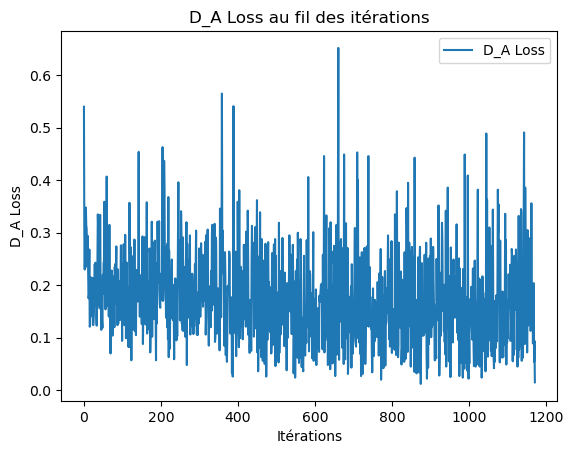

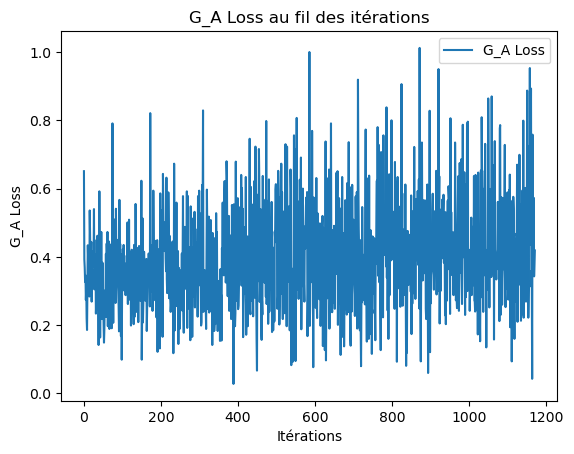

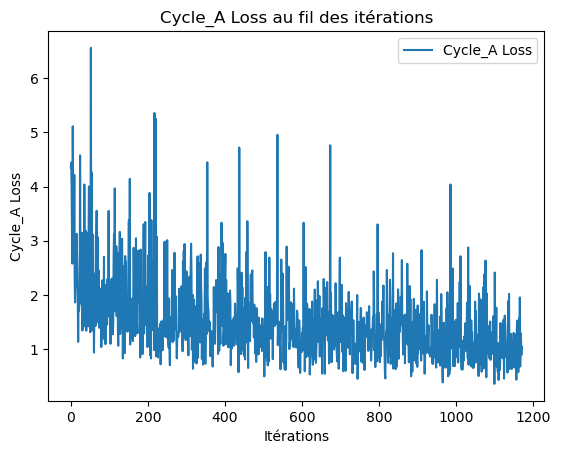

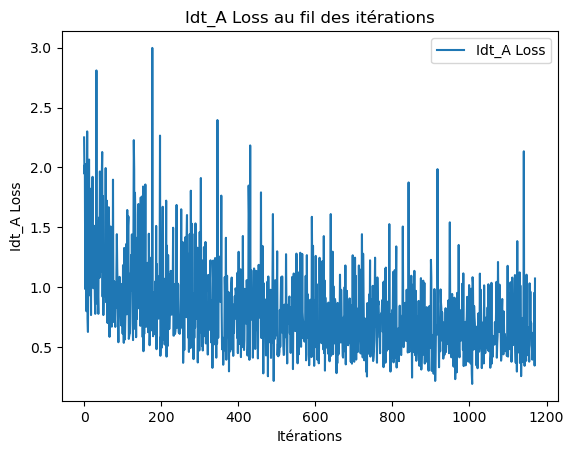

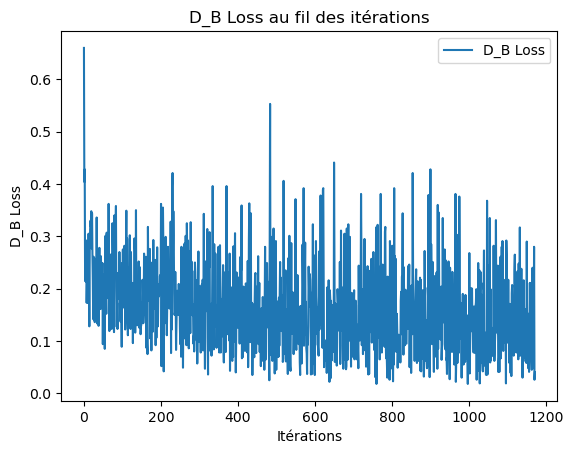

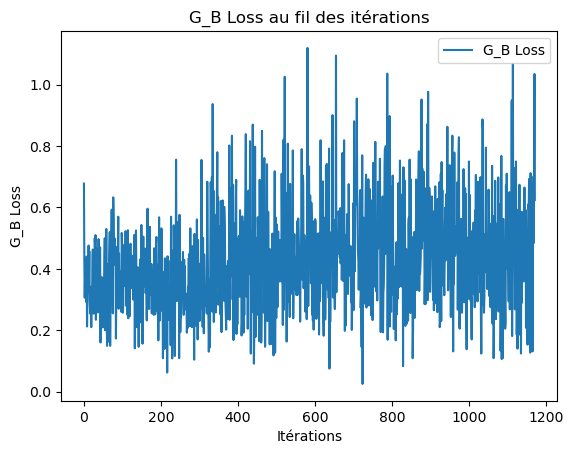

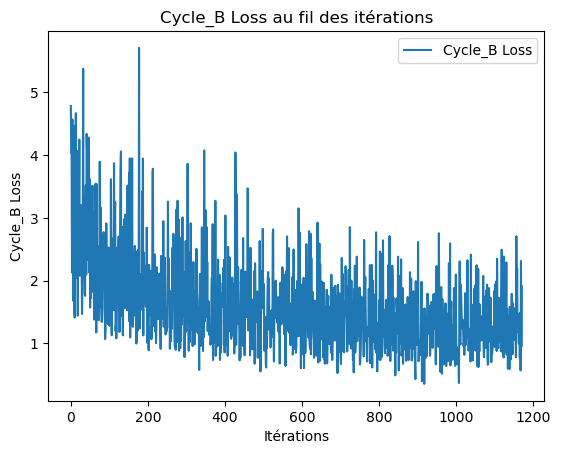

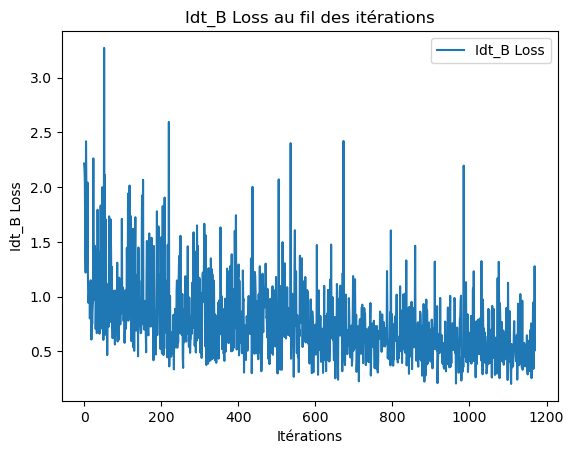

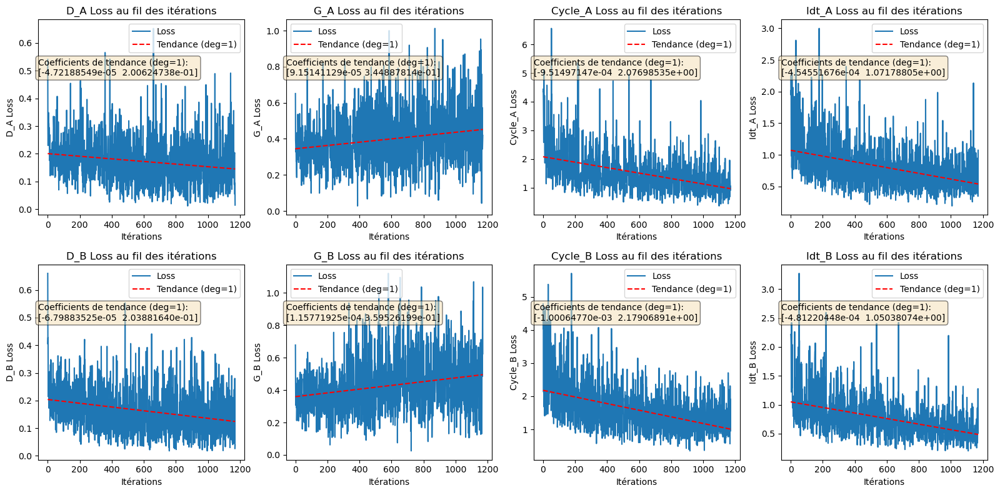

In [7]:
#Que les 100 premières épochs

import re
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Initialiser des listes pour stocker les valeurs de perte
epochs = []
D_A_losses = []
G_A_losses = []
cycle_A_losses = []
idt_A_losses = []
D_B_losses = []
G_B_losses = []
cycle_B_losses = []
idt_B_losses = []

# Expression régulière pour extraire les valeurs de perte
pattern = re.compile(r'epoch: (\d+).*D_A: ([\d.]+) G_A: ([\d.]+) cycle_A: ([\d.]+) idt_A: ([\d.]+) D_B: ([\d.]+) G_B: ([\d.]+) cycle_B: ([\d.]+) idt_B: ([\d.]+)')

# Liste pour stocker les numéros d'epoch
epochs = []

# ... (le reste de votre code)

with open(file_path, 'r') as fichier:
    for ligne in fichier:
        # Vérifier si la ligne commence par le motif "================ Training Loss"
        if ligne.startswith("================ Training Loss"):
            continue  # Ignorer cette ligne et passer à la suivante

        # Utiliser l'expression régulière pour extraire les valeurs de perte et le numéro d'epoch
        match = pattern.search(ligne)
        if match:
            if int(match.group(1)) > 100:
                break
            D_A_losses.append(float(match.group(2)))
            G_A_losses.append(float(match.group(3)))
            cycle_A_losses.append(float(match.group(4)))
            idt_A_losses.append(float(match.group(5)))
            D_B_losses.append(float(match.group(6)))
            G_B_losses.append(float(match.group(7)))
            cycle_B_losses.append(float(match.group(8)))
            idt_B_losses.append(float(match.group(9)))

# Tracer les graphiques
plt.plot(D_A_losses,  label='D_A Loss')
plt.xlabel('Itérations')
plt.ylabel('D_A Loss')
plt.title('D_A Loss au fil des itérations')
plt.legend()
plt.show()

plt.plot(G_A_losses, label='G_A Loss')
plt.xlabel('Itérations')
plt.ylabel('G_A Loss')
plt.title('G_A Loss au fil des itérations')
plt.legend()
plt.show()

plt.plot(cycle_A_losses, label='Cycle_A Loss')
plt.xlabel('Itérations')
plt.ylabel('Cycle_A Loss')
plt.title('Cycle_A Loss au fil des itérations')
plt.legend()
plt.show()

plt.plot(idt_A_losses, label='Idt_A Loss')
plt.xlabel('Itérations')
plt.ylabel('Idt_A Loss')
plt.title('Idt_A Loss au fil des itérations')
plt.legend()
plt.show()

plt.plot(D_B_losses, label='D_B Loss')
plt.xlabel('Itérations')
plt.ylabel('D_B Loss')
plt.title('D_B Loss au fil des itérations')
plt.legend()
plt.show()

plt.plot(G_B_losses, label='G_B Loss')
plt.xlabel('Itérations')
plt.ylabel('G_B Loss')
plt.title('G_B Loss au fil des itérations')
plt.legend()
plt.show()

plt.plot(cycle_B_losses, label='Cycle_B Loss')
plt.xlabel('Itérations')
plt.ylabel('Cycle_B Loss')
plt.title('Cycle_B Loss au fil des itérations')
plt.legend()
plt.show()

plt.plot(idt_B_losses, label='Idt_B Loss')
plt.xlabel('Itérations')
plt.ylabel('Idt_B Loss')
plt.title('Idt_B Loss au fil des itérations')
plt.legend()
plt.show()

def add_trendline(ax, x, y, order=1, color='red'):
    coeffs = np.polyfit(x, y, order)
    trendline = np.poly1d(coeffs)
    x_range = np.linspace(min(x), max(x), 100)
    ax.plot(x_range, trendline(x_range), color=color, linestyle='--', label=f'Tendance (deg={order})')

    # Ajouter les coefficients de la ligne de tendance au graphique
    text = f'Coefficients de tendance (deg={order}):\n{coeffs}'
    ax.text(0, 0.8, text, transform=ax.transAxes, fontsize=10, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))


# Tracer les graphiques avec les courbes de tendance
fig, axs = plt.subplots(2, 4, figsize=(16, 8))

# Liste des listes de valeurs de perte
loss_lists = [D_A_losses, G_A_losses, cycle_A_losses, idt_A_losses, D_B_losses, G_B_losses, cycle_B_losses, idt_B_losses]

# Liste des titres pour les graphiques
titles = ['D_A Loss', 'G_A Loss', 'Cycle_A Loss', 'Idt_A Loss', 'D_B Loss', 'G_B Loss', 'Cycle_B Loss', 'Idt_B Loss']

# Tracer les graphiques avec les courbes de tendance
for ax, losses, title in zip(axs.flatten(), loss_lists, titles):
    ax.plot(losses, label='Loss')
    add_trendline(ax, range(len(losses)), losses)
    ax.set_xlabel('Itérations')
    ax.set_ylabel(title)
    ax.set_title(f'{title} au fil des itérations')
    ax.legend()

# Ajuster l'espacement entre les graphiques
plt.tight_layout()
plt.show()

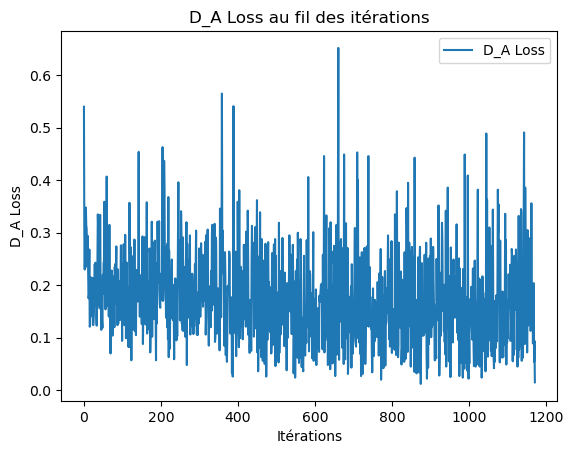

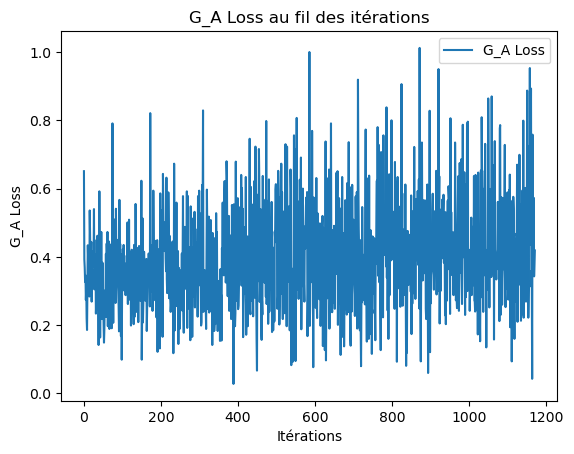

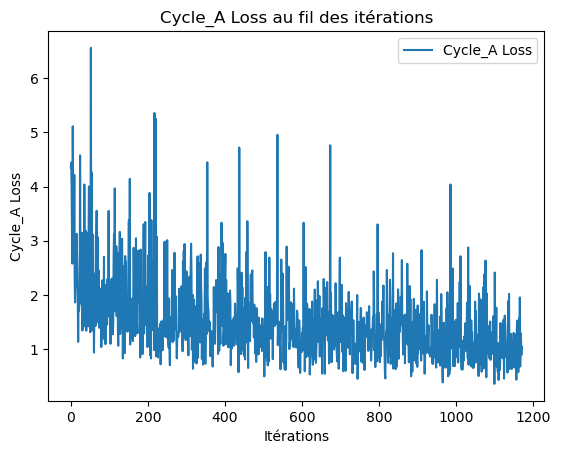

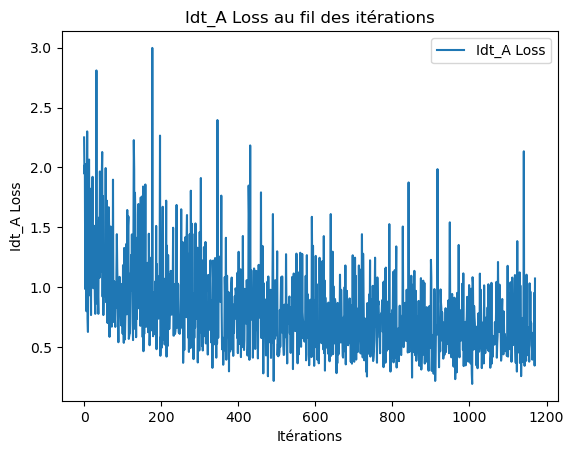

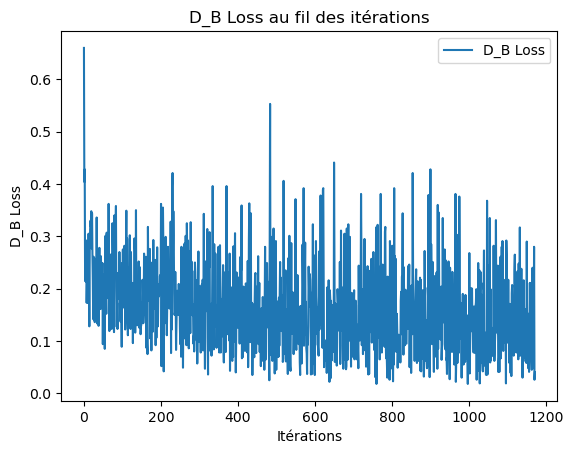

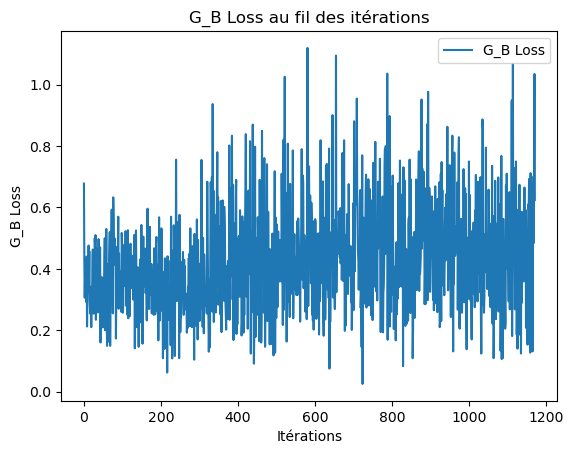

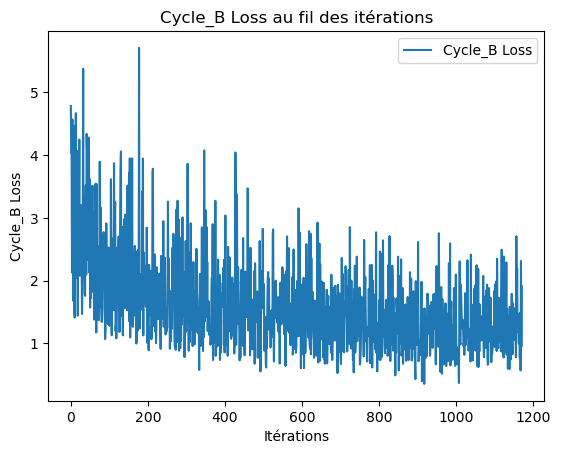

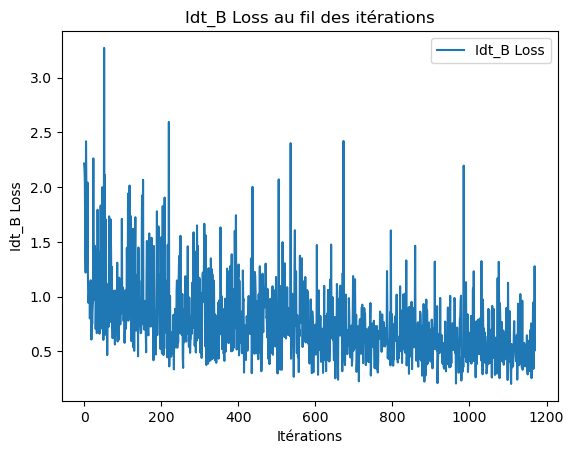

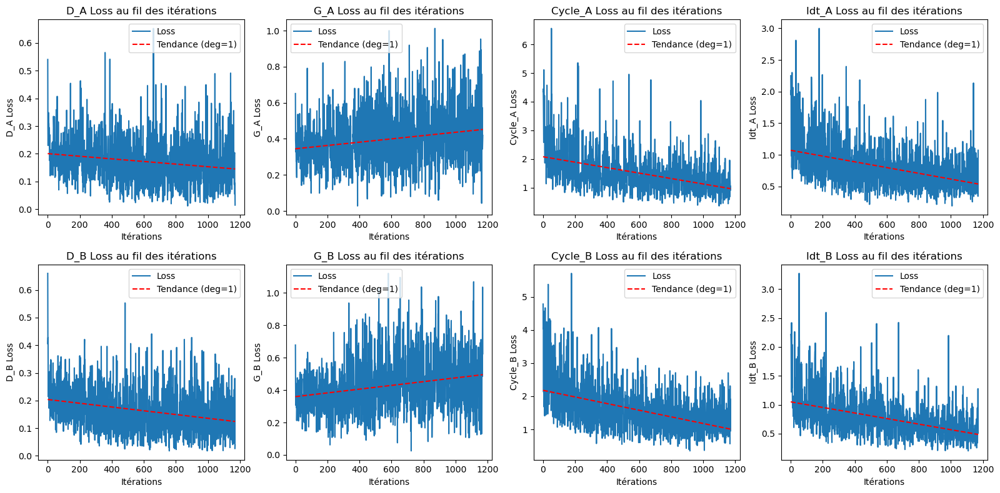

In [5]:
import re
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Initialiser des listes pour stocker les valeurs de perte
epochs = []
D_A_losses = []
G_A_losses = []
cycle_A_losses = []
idt_A_losses = []
D_B_losses = []
G_B_losses = []
cycle_B_losses = []
idt_B_losses = []

# Expression régulière pour extraire les valeurs de perte
pattern = re.compile(r'D_A: ([0-9.]+) G_A: ([0-9.]+) cycle_A: ([0-9.]+) idt_A: ([0-9.]+) D_B: ([0-9.]+) G_B: ([0-9.]+) cycle_B: ([0-9.]+) idt_B: ([0-9.]+)')

with open(file_path, 'r') as fichier:
    for ligne in fichier:
        # Vérifier si la ligne commence par le motif "================ Training Loss"
        if ligne.startswith("================ Training Loss"):
            continue  # Ignorer cette ligne et passer à la suivante

        # Utiliser l'expression régulière pour extraire les valeurs de perte
        match = pattern.search(ligne)
        if match:
            D_A_losses.append(float(match.group(1)))
            G_A_losses.append(float(match.group(2)))
            cycle_A_losses.append(float(match.group(3)))
            idt_A_losses.append(float(match.group(4)))
            D_B_losses.append(float(match.group(5)))
            G_B_losses.append(float(match.group(6)))
            cycle_B_losses.append(float(match.group(7)))
            idt_B_losses.append(float(match.group(8)))

# Tracer les graphiques
plt.plot(D_A_losses,  label='D_A Loss')
plt.xlabel('Itérations')
plt.ylabel('D_A Loss')
plt.title('D_A Loss au fil des itérations')
plt.legend()
plt.show()

plt.plot(G_A_losses, label='G_A Loss')
plt.xlabel('Itérations')
plt.ylabel('G_A Loss')
plt.title('G_A Loss au fil des itérations')
plt.legend()
plt.show()

plt.plot(cycle_A_losses, label='Cycle_A Loss')
plt.xlabel('Itérations')
plt.ylabel('Cycle_A Loss')
plt.title('Cycle_A Loss au fil des itérations')
plt.legend()
plt.show()

plt.plot(idt_A_losses, label='Idt_A Loss')
plt.xlabel('Itérations')
plt.ylabel('Idt_A Loss')
plt.title('Idt_A Loss au fil des itérations')
plt.legend()
plt.show()

plt.plot(D_B_losses, label='D_B Loss')
plt.xlabel('Itérations')
plt.ylabel('D_B Loss')
plt.title('D_B Loss au fil des itérations')
plt.legend()
plt.show()

plt.plot(G_B_losses, label='G_B Loss')
plt.xlabel('Itérations')
plt.ylabel('G_B Loss')
plt.title('G_B Loss au fil des itérations')
plt.legend()
plt.show()

plt.plot(cycle_B_losses, label='Cycle_B Loss')
plt.xlabel('Itérations')
plt.ylabel('Cycle_B Loss')
plt.title('Cycle_B Loss au fil des itérations')
plt.legend()
plt.show()

plt.plot(idt_B_losses, label='Idt_B Loss')
plt.xlabel('Itérations')
plt.ylabel('Idt_B Loss')
plt.title('Idt_B Loss au fil des itérations')
plt.legend()
plt.show()

def add_trendline(ax, x, y, order=1, color='red'):
    coeffs = np.polyfit(x, y, order)
    trendline = np.poly1d(coeffs)
    x_range = np.linspace(min(x), max(x), 100)
    ax.plot(x_range, trendline(x_range), color=color, linestyle='--', label=f'Tendance (deg={order})')

# Tracer les graphiques avec les courbes de tendance
fig, axs = plt.subplots(2, 4, figsize=(16, 8))

# Liste des listes de valeurs de perte
loss_lists = [D_A_losses, G_A_losses, cycle_A_losses, idt_A_losses, D_B_losses, G_B_losses, cycle_B_losses, idt_B_losses]

# Liste des titres pour les graphiques
titles = ['D_A Loss', 'G_A Loss', 'Cycle_A Loss', 'Idt_A Loss', 'D_B Loss', 'G_B Loss', 'Cycle_B Loss', 'Idt_B Loss']

# Tracer les graphiques avec les courbes de tendance
for ax, losses, title in zip(axs.flatten(), loss_lists, titles):
    ax.plot(losses, label='Loss')
    add_trendline(ax, range(len(losses)), losses)
    ax.set_xlabel('Itérations')
    ax.set_ylabel(title)
    ax.set_title(f'{title} au fil des itérations')
    ax.legend()

# Ajuster l'espacement entre les graphiques
plt.tight_layout()
plt.show()